# Siletti 2022 - Clustering
<div class="alert alert-warning">

**What this notebook does**
    
In this notebooke the previously normalized samples will be merged and batch corrected to visualize the full dataset of Siletti et. al. Additionally, existing annotation and sample specific prefixes were added. This is the last step within the atlas processing.

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering')

In [4]:
!ls data

agarwal_base_merge_base.h5ad  smajic_base_merge_base.h5ad
agarwal_merge_base_BC.h5ad    smajic_doublets_merge_base.h5ad
altena_base_merge_base.h5ad   smajic_merge_base_BC.h5ad
altena_merge_base_BC.h5ad     wang_base_merge_base.h5ad
siletti_base_merge_base.h5ad  wang_merge_base_BC.h5ad
siletti_base_merge_BC.h5ad    welch_base_merge_base.h5ad
siletti_merge_base_BC.h5ad    welch_merge_base_BC.h5ad


In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/4_clustering'

In [6]:
path='/home/hers_basak/jjiang/jack/outputs/deliverables/3_normalization/data/processed_'
suffix='base'
atlas='siletti'

S173_3=f'{path}{atlas}_{suffix}_S173_3.h5ad'
S173_4=f'{path}{atlas}_{suffix}_S173_4.h5ad'
S173_5=f'{path}{atlas}_{suffix}_S173_5.h5ad'
S175_7=f'{path}{atlas}_{suffix}_S175_7.h5ad'
S175_8=f'{path}{atlas}_{suffix}_S175_8.h5ad'
S176_1=f'{path}{atlas}_{suffix}_S176_1.h5ad'
S176_2=f'{path}{atlas}_{suffix}_S176_2.h5ad'
S193_1=f'{path}{atlas}_{suffix}_S193_1.h5ad'
S193_2=f'{path}{atlas}_{suffix}_S193_2.h5ad'
S194_4=f'{path}{atlas}_{suffix}_S194_4.h5ad'
S194_5=f'{path}{atlas}_{suffix}_S194_5.h5ad'
S194_6=f'{path}{atlas}_{suffix}_S194_6.h5ad'
S194_7=f'{path}{atlas}_{suffix}_S194_7.h5ad'
S194_8=f'{path}{atlas}_{suffix}_S194_8.h5ad'
S225_1=f'{path}{atlas}_{suffix}_S225_1.h5ad'
S225_2=f'{path}{atlas}_{suffix}_S225_2.h5ad'
S230_1=f'{path}{atlas}_{suffix}_S230_1.h5ad'
S230_2=f'{path}{atlas}_{suffix}_S230_2.h5ad'
S230_3=f'{path}{atlas}_{suffix}_S230_3.h5ad'
S230_4=f'{path}{atlas}_{suffix}_S230_4.h5ad'
S236_1=f'{path}{atlas}_{suffix}_S236_1.h5ad'
S236_2=f'{path}{atlas}_{suffix}_S236_2.h5ad'
S237_3=f'{path}{atlas}_{suffix}_S237_3.h5ad'
S330_7=f'{path}{atlas}_{suffix}_S330_7.h5ad'
S330_8=f'{path}{atlas}_{suffix}_S330_8.h5ad'
S354_1=f'{path}{atlas}_{suffix}_S354_1.h5ad'
S354_2=f'{path}{atlas}_{suffix}_S354_2.h5ad'
S358_1=f'{path}{atlas}_{suffix}_S358_1.h5ad'
S358_2=f'{path}{atlas}_{suffix}_S358_2.h5ad'
S358_3=f'{path}{atlas}_{suffix}_S358_3.h5ad'
S358_4=f'{path}{atlas}_{suffix}_S358_4.h5ad'
S375_7=f'{path}{atlas}_{suffix}_S375_7.h5ad'
S375_8=f'{path}{atlas}_{suffix}_S375_8.h5ad'
S376_1=f'{path}{atlas}_{suffix}_S376_1.h5ad'
S376_2=f'{path}{atlas}_{suffix}_S376_2.h5ad'
S377_7=f'{path}{atlas}_{suffix}_S377_7.h5ad'
S377_8=f'{path}{atlas}_{suffix}_S377_8.h5ad'
S378_3=f'{path}{atlas}_{suffix}_S378_3.h5ad'
S378_4=f'{path}{atlas}_{suffix}_S378_4.h5ad'
S378_5=f'{path}{atlas}_{suffix}_S378_5.h5ad'
S378_6=f'{path}{atlas}_{suffix}_S378_6.h5ad'
S389_3=f'{path}{atlas}_{suffix}_S389_3.h5ad'
S389_4=f'{path}{atlas}_{suffix}_S389_4.h5ad'


In [7]:
files = [S173_3,S173_4,S173_5,S175_7,S175_8,S176_1,S176_2,S193_1,S193_2,
         S194_4,S194_5,S194_6,S194_7,S194_8,S225_1,S225_2,S230_1,S230_2,
         S230_3,S230_4,S236_1,S236_2,S237_3,S330_7,S330_8,S354_1,S354_2,
         S358_1,S358_2,S358_3,S358_4,S375_7,S375_8,S376_1,S376_2,S377_7,
         S377_8,S378_3,S378_4,S378_5,S378_6,S389_3,S389_4]
names = ['S173_3','S173_4','S173_5','S175_7','S175_8','S176_1','S176_2',
         'S193_1','S193_2','S194_4','S194_5','S194_6','S194_7','S194_8',
         'S225_1','S225_2','S230_1','S230_2','S230_3','S230_4','S236_1',
         'S236_2','S237_3','S330_7','S330_8','S354_1','S354_2','S358_1',
         'S358_2','S358_3','S358_4','S375_7','S375_8','S376_1','S376_2',
         'S377_7','S377_8','S378_3','S378_4','S378_5','S378_6','S389_3',
         'S389_4'] #used for making variable names
object_names_merged=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_merged.append("adata"+"_"+names[i]+"_"+"preprocessed")
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

KeyboardInterrupt: 

In [ ]:

metadata_neuron = sc.read('/home/hers_basak/jjiang/jack/outputs/count_files/homo_sap/siletti_2022/filtered_neurons.h5ad') 
print('filtered neurons is loaded')
metadata_nonneuron = sc.read('/home/hers_basak/jjiang/jack/outputs/count_files/homo_sap/siletti_2022/filtered_nonneurons.h5ad') 
print('filtered non neurons is loaded')

In [ ]:
metadata_neuron.obs['ROIGroupCoarse']

In [ ]:
metadata_nonneuron

In [ ]:

for i in range(numberobj):
    locals()[object_names_merged[i]].obs_names= ['10X'+names[i].replace('S','')+':'+name.replace('-1','') if name[0]!='1' else name[0:-2] for name in locals()[object_names_merged[i]].obs_names ]
    

In [ ]:
locals()[object_names_merged[1]]

## Merge
Observation suffixes are sample specific, so to match the older atlas annotation we match there suffixes.

In [ ]:
adata_merge=ad.concat([adata_S173_3_preprocessed,adata_S173_4_preprocessed,adata_S173_5_preprocessed,adata_S175_7_preprocessed,adata_S175_8_preprocessed,adata_S176_1_preprocessed,adata_S176_2_preprocessed,adata_S193_1_preprocessed,adata_S193_2_preprocessed,adata_S194_4_preprocessed,adata_S194_5_preprocessed,adata_S194_6_preprocessed,adata_S194_7_preprocessed,adata_S194_8_preprocessed,adata_S225_1_preprocessed,adata_S225_2_preprocessed,adata_S230_1_preprocessed,adata_S230_2_preprocessed,adata_S230_3_preprocessed,adata_S230_4_preprocessed,adata_S236_1_preprocessed,adata_S236_2_preprocessed,adata_S237_3_preprocessed,adata_S330_7_preprocessed,adata_S330_8_preprocessed,adata_S354_1_preprocessed,adata_S354_2_preprocessed,adata_S358_1_preprocessed,adata_S358_2_preprocessed,adata_S358_3_preprocessed,adata_S358_4_preprocessed,adata_S375_7_preprocessed,adata_S375_8_preprocessed,adata_S376_1_preprocessed,adata_S376_2_preprocessed,adata_S377_7_preprocessed,adata_S377_8_preprocessed,adata_S378_3_preprocessed,adata_S378_4_preprocessed,adata_S378_5_preprocessed,adata_S378_6_preprocessed,adata_S389_3_preprocessed,adata_S389_4_preprocessed],  join="outer", fill_value=0)


In [ ]:
metadata_merge=ad.concat([metadata_nonneuron,metadata_neuron],join="outer",fill_value=0)

In [ ]:
adata_merge.obs_names

In [ ]:
metadata_merge

In [ ]:
supercluster_term =list()
cluster_id=list()
subcluster_id=list()

annotation=[supercluster_term, cluster_id, subcluster_id]
annotation_names=['original_supercluster_term', 'original_cluster_id', 'original_subcluster_id']
annotation_names_og=['supercluster_term', 'cluster_id', 'subcluster_id']


for i in range(len(annotation)):
    except_counter=0
    for obs_name in adata_merge.obs_names:
        try:
            annotation[i].append(metadata_merge.obs[annotation_names_og[i]][obs_name])
        except:
            except_counter+=1
            annotation[i].append('None')
    print(except_counter)
    


In [ ]:
set(subcluster_id)

In [ ]:
for i in range(len(annotation)):
    adata_merge.obs[annotation_names[i]]= annotation[i]

In [ ]:
adata_merge.obs['original_cluster_id']=adata_merge.obs['original_cluster_id'].astype(str)
adata_merge.obs['original_subcluster_id']=adata_merge.obs['original_subcluster_id'].astype(str)


In [ ]:
type(adata_merge.obs['original_cluster_id'])

In [45]:
adata_merge.write(os.path.join('./data/siletti_base_merge_base.h5ad'))


In [7]:
object_names_merged = ['adata_merge']
names = ['siletti_merge']
path='/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering/data'
files=[f'{path}/siletti_base_merge_base.h5ad']

numberobj=1
for i in range(numberobj):
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_merge  is loaded


## All data

pca again

In [8]:
#To make reproducible plots
np.random.seed(41)

In [9]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged[i]], svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

siletti_merge


In [10]:
nn= 15 #default 15
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged[i]], n_neighbors=nn, n_pcs=40)
    sc.tl.umap(locals()[object_names_merged[i]])

siletti_merge


siletti_merge


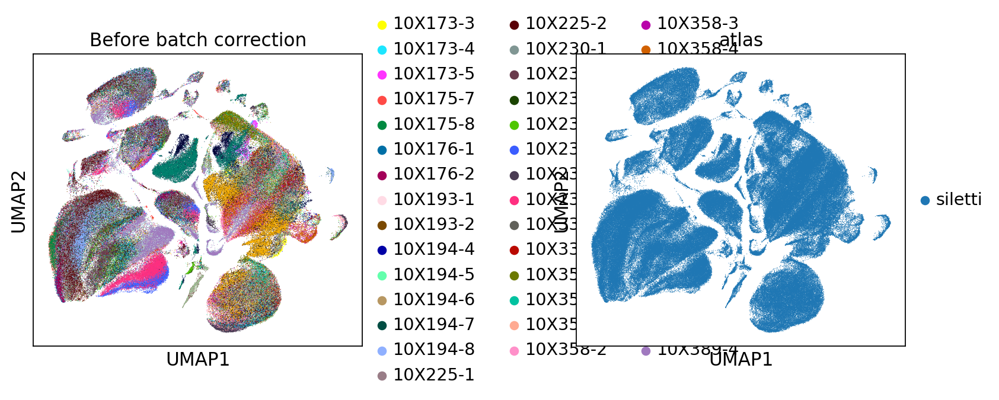

In [11]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged[i]],color=['sample', 'atlas'], wspace=0.5,s=1, title='Before batch correction')

In [13]:
adata_merge.obs

,species,gender,age,atlas,sample,doublet_score,predicted_doublet,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,...,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,n_genes,total_counts_mito,total_counts_norm,original_supercluster_term,original_cluster_id,original_subcluster_id
10X173_3:TATCTTGGTGCATTAC,Homo sapien,male,50 years,siletti,10X173-3,0.192683,False,14155,9.557894,163127,...,0.820131,830,6.722630,0.504602,14165,164486,163127,None,None,None
10X173_3:CTCATCGTCGTTCTAT,Homo sapien,male,50 years,siletti,10X173-3,0.104221,False,14578,9.587337,158998,...,0.687041,876,6.776507,0.547134,14586,160107,158998,None,None,None
10X173_3:TCTACCGGTCCCTCAT,Homo sapien,male,50 years,siletti,10X173-3,0.192683,False,13260,9.492583,143078,...,0.359309,688,6.535241,0.479079,13275,143609,143078,None,None,None
10X173_3:CGTAAGTTCTGCTCTG,Homo sapien,male,50 years,siletti,10X173-3,0.098044,False,14204,9.561349,128750,...,0.861545,989,6.897705,0.761455,14218,129883,128750,None,None,None
10X173_3:GATCCCTAGGGTTAAT,Homo sapien,male,50 years,siletti,10X173-3,0.098044,False,13488,9.509630,121263,...,0.741559,915,6.820016,0.748926,13494,122175,121263,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10X389_4:TTGGTTTCAAGGTTGG,Homo sapien,male,42 years,siletti,10X389-4,0.010863,False,551,6.313548,651,...,0.000000,4,1.609438,0.614439,551,651,651,None,None,None
10X389_4:GATTTCTAGGAATCGC,Homo sapien,male,42 years,siletti,10X389-4,0.058265,False,550,6.311735,667,...,0.298954,6,1.945910,0.896861,550,669,667,None,None,None
10X389_4:TTACGCCTCTTCGACC,Homo sapien,male,42 years,siletti,10X389-4,0.016929,False,505,6.226537,631,...,0.000000,2,1.098612,0.316957,505,631,631,None,None,None
10X389_4:TCGGGACAGCTGTGCC,Homo sapien,male,42 years,siletti,10X389-4,0.074914,False,529,6.272877,660,...,0.452489,19,2.995732,2.865762,529,663,660,None,None,None


siletti_merge


KeyboardInterrupt: 

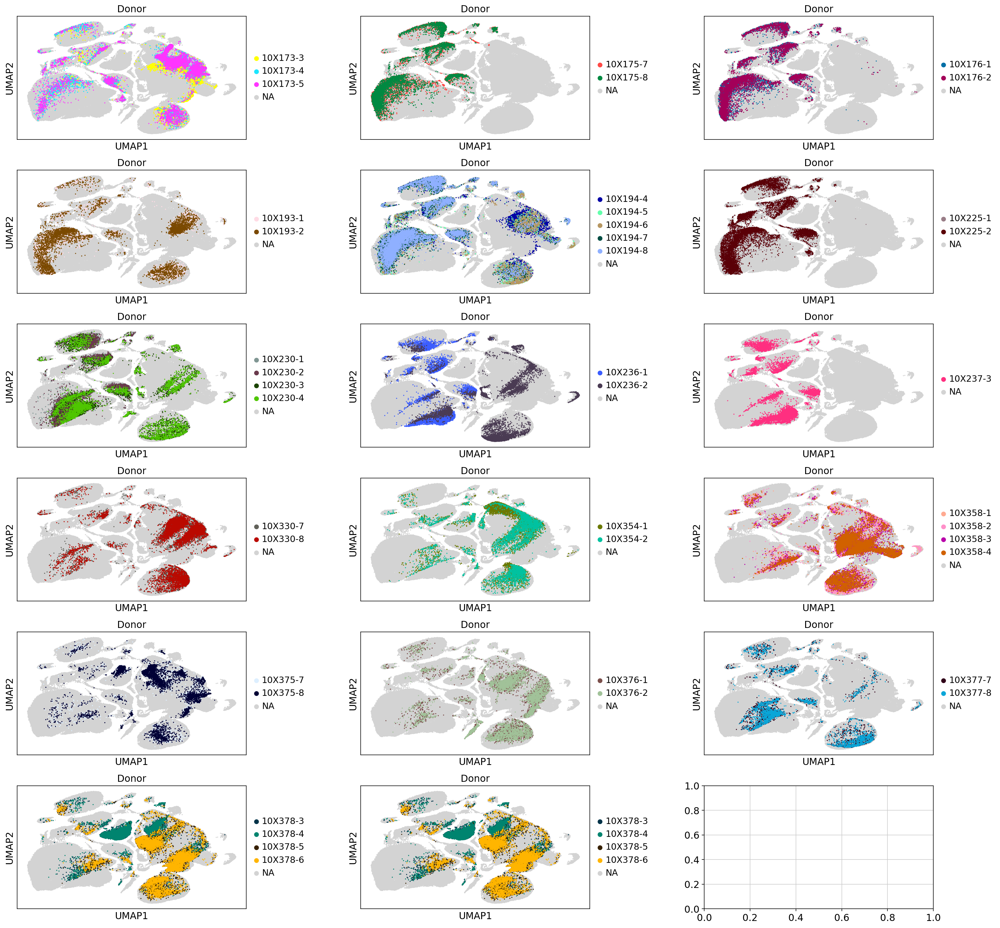

In [14]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(6, 3, figsize = [24,24])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X173-3','10X173-4','10X173-5'], use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X175-7','10X175-8'], use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X176-1','10X176-2'], use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X193-1','10X193-2'], use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X194-4','10X194-5','10X194-6','10X194-7','10X194-8'], use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X225-1','10X225-2'], use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X230-1','10X230-2','10X230-3','10X230-4'], use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X236-1','10X236-2'], use_raw=False, s=10, ax= axs[2,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X237-3'], use_raw=False, s=10, ax= axs[2,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X330-7','10X330-8'], use_raw=False, s=10, ax= axs[3,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X354-1','10X354-2'], use_raw=False, s=10, ax= axs[3,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups=['10X358-1','10X358-2','10X358-3','10X358-4'], use_raw=False, s=10, ax= axs[3,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X375-7','10X375-8'], use_raw=False, s=10, ax= axs[4,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X376-1','10X376-2'], use_raw=False, s=10, ax= axs[4,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X377-7','10X377-8'], use_raw=False, s=10, ax= axs[4,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= ['10X378-3','10X378-4','10X378-5','10X378-6'], use_raw=False, s=10, ax= axs[5,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups=['10X378-3','10X378-4','10X378-5','10X378-6'], use_raw=False, s=10, ax= axs[5,1],show=False, title=title1)
    
    fig.savefig(f'figures/{names[i]}_subplots.png',bbox_inches='tight')

In [ ]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_merged[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_merged[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','TH'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=1, save=f'/{names[i]}_subplots_markers.png')
    else:
        sc.pl.umap(locals()[object_names_merged[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25
                  )#,save = "_merge_umap_n"+str(nn)+"_2.pdf")

# Batch Correction

In [15]:
locals()[object_names_merged[0]]

AnnData object with n_obs × n_vars = 287523 × 44237
    obs: 'species', 'gender', 'age', 'atlas', 'sample', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'original_supercluster_term', 'original_cluster_id', 'original_subcluster_id'
    uns: 'pca', 'neighbors', 'umap', 'sample_colors', 'atlas_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [16]:
locals()[object_names_merged[0]].obs['donor'] = locals()[object_names_merged[0]].obs['sample'].str.slice(0, 6)

In [17]:
object_names_merged_BC=list()

for i in range(numberobj):
    object_names_merged_BC.append("adata"+"_"+names[i]+"_"+"full_BC")
    locals()[object_names_merged_BC[i]] = locals()[object_names_merged[i]].copy()
    print(object_names_merged_BC[i],' is loaded')

adata_siletti_merge_full_BC  is loaded


In [18]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged_BC[i]], svd_solver='arpack')

siletti_merge


In [19]:
for i in range(numberobj):
    print(names[i])
    sc.external.pp.harmony_integrate(locals()[object_names_merged_BC[i]], key =['donor'])

siletti_merge


2023-09-27 14:59:52,605 - harmonypy - INFO - Iteration 1 of 10
2023-09-27 15:02:57,819 - harmonypy - INFO - Iteration 2 of 10
2023-09-27 15:06:08,087 - harmonypy - INFO - Iteration 3 of 10
2023-09-27 15:09:12,136 - harmonypy - INFO - Converged after 3 iterations


In [ ]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]], color=['n_genes', 'total_counts', 'pct_counts_mt', 'sample', 'atlas'],wspace=0.5)


siletti_merge


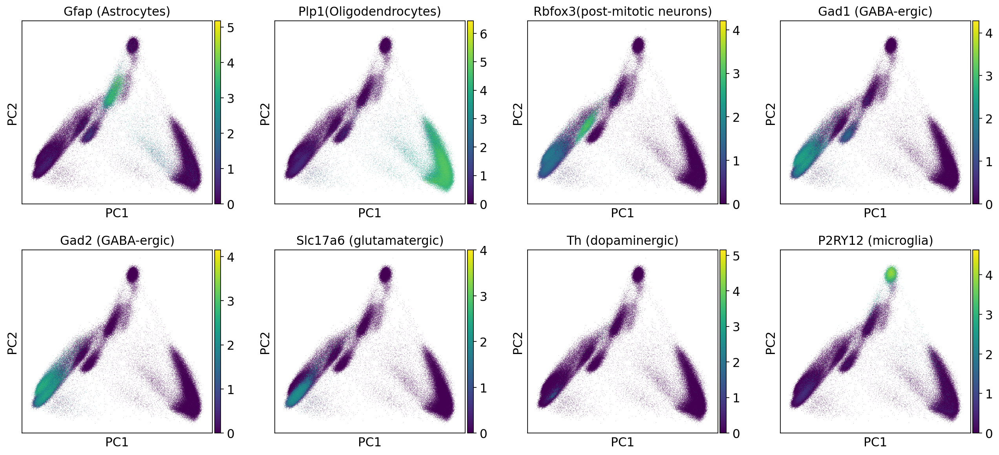

In [21]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]],use_raw=False, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

In [22]:
nn=40
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged_BC[i]], n_neighbors=nn, n_pcs=50,use_rep='X_pca_harmony')
    sc.tl.umap(locals()[object_names_merged_BC[i]])
    

siletti_merge


siletti_merge


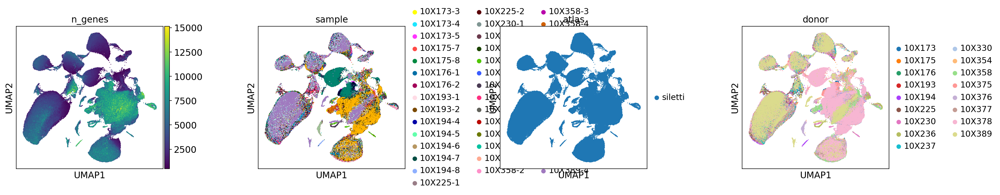

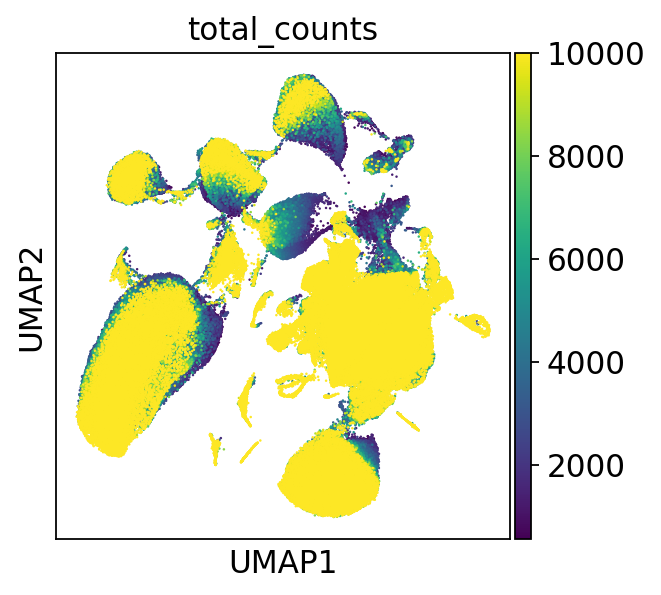

In [23]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['n_genes','sample', 'atlas','donor'], 
               use_raw=False, s=5, wspace=0.5)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='total_counts', vmax=10000,
               use_raw=False, s=5, wspace=0.5)
    

siletti_merge


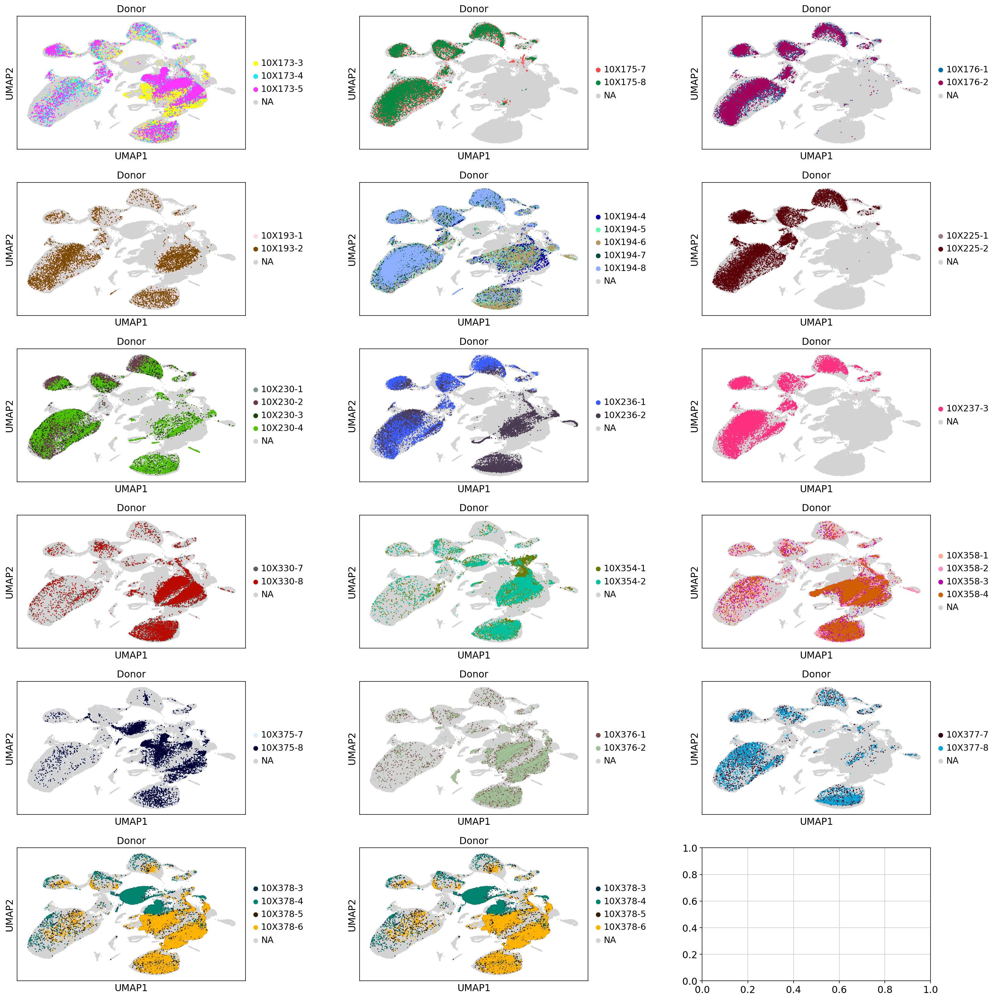

In [24]:

feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(6, 3, figsize = [24,26])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X173-3','10X173-4','10X173-5'], use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X175-7','10X175-8'], use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X176-1','10X176-2'], use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X193-1','10X193-2'], use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X194-4','10X194-5','10X194-6','10X194-7','10X194-8'], use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X225-1','10X225-2'], use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X230-1','10X230-2','10X230-3','10X230-4'], use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X236-1','10X236-2'], use_raw=False, s=10, ax= axs[2,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X237-3'], use_raw=False, s=10, ax= axs[2,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X330-7','10X330-8'], use_raw=False, s=10, ax= axs[3,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X354-1','10X354-2'], use_raw=False, s=10, ax= axs[3,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups=['10X358-1','10X358-2','10X358-3','10X358-4'], use_raw=False, s=10, ax= axs[3,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X375-7','10X375-8'], use_raw=False, s=10, ax= axs[4,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X376-1','10X376-2'], use_raw=False, s=10, ax= axs[4,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X377-7','10X377-8'], use_raw=False, s=10, ax= axs[4,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= ['10X378-3','10X378-4','10X378-5','10X378-6'], use_raw=False, s=10, ax= axs[5,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups=['10X378-3','10X378-4','10X378-5','10X378-6'], use_raw=False, s=10, ax= axs[5,1],show=False, title=title1)
    
    fig.savefig(f'figures/{names[i]}_subplots.png',bbox_inches='tight')

siletti_merge


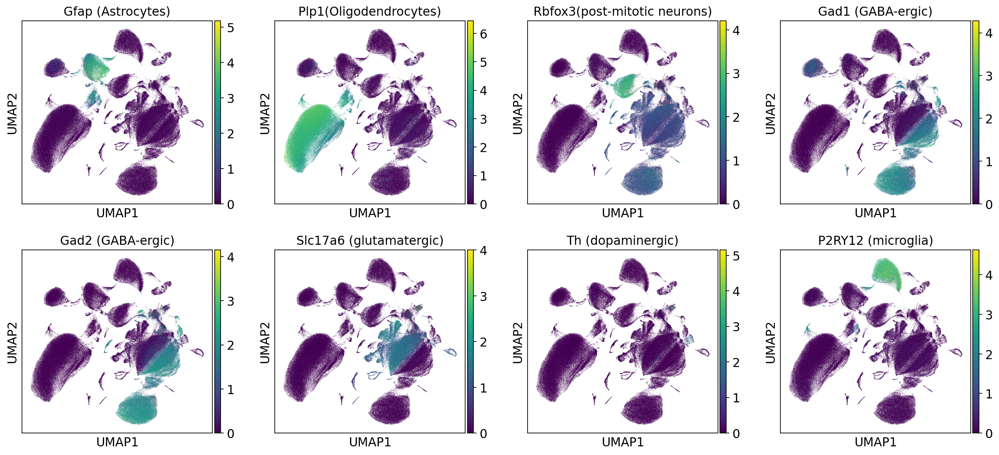

In [25]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],use_raw=False,title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

siletti_merge


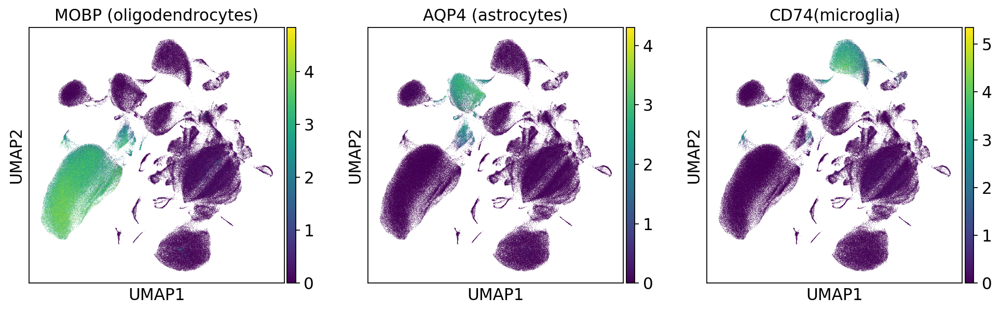

In [26]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['MOBP','AQP4', 'CD74' ],use_raw=False,title=['MOBP (oligodendrocytes)','AQP4 (astrocytes)','CD74(microglia)'])

In [29]:
locals()[object_names_merged_BC[i]]

AnnData object with n_obs × n_vars = 287523 × 44237
    obs: 'species', 'gender', 'age', 'atlas', 'sample', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'original_supercluster_term', 'original_cluster_id', 'original_subcluster_id', 'donor'
    uns: 'pca', 'neighbors', 'umap', 'sample_colors', 'atlas_colors', 'donor_colors'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [28]:
adata_siletti_merge_full_BC.write(os.path.join('./data/siletti_base_merge_BC.h5ad'))